In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

In [2]:
df = pd.read_csv('ED_PatientCount.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39838 entries, 0 to 39837
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         39838 non-null  object 
 1   Hour         39838 non-null  int64  
 2   ED_Patients  39831 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 933.8+ KB


In [4]:
df

,Date,Hour,ED_Patients
0,6/29/2018,0,23.0
1,6/29/2018,1,20.0
2,6/29/2018,2,16.0
3,6/29/2018,3,6.0
4,6/29/2018,4,4.0
...,...,...,...
39833,1/26/2023,5,16.0
39834,1/26/2023,6,19.0
39835,1/26/2023,7,16.0
39836,1/26/2023,8,21.0


In [5]:
df = pd.read_csv('ED_PatientCount.csv',
                 parse_dates= {"date_hour" : ["Date","Hour"]},
                 keep_date_col=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39838 entries, 0 to 39837
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date_hour    39838 non-null  object 
 1   Date         39838 non-null  object 
 2   Hour         39838 non-null  object 
 3   ED_Patients  39831 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.2+ MB


In [7]:
df

,date_hour,Date,Hour,ED_Patients
0,6/29/2018 0,6/29/2018,0,23.0
1,6/29/2018 1,6/29/2018,1,20.0
2,6/29/2018 2,6/29/2018,2,16.0
3,6/29/2018 3,6/29/2018,3,6.0
4,6/29/2018 4,6/29/2018,4,4.0
...,...,...,...,...
39833,1/26/2023 5,1/26/2023,5,16.0
39834,1/26/2023 6,1/26/2023,6,19.0
39835,1/26/2023 7,1/26/2023,7,16.0
39836,1/26/2023 8,1/26/2023,8,21.0


In [8]:
df['date_hour']=pd.to_datetime(df.date_hour, format="%m/%d/%Y %H")
df['Date']=pd.to_datetime(df.Date, format="%m/%d/%Y")
df['Hour']=pd.to_numeric(df.Hour)

In [9]:
df

,date_hour,Date,Hour,ED_Patients
0,2018-06-29 00:00:00,2018-06-29,0,23.0
1,2018-06-29 01:00:00,2018-06-29,1,20.0
2,2018-06-29 02:00:00,2018-06-29,2,16.0
3,2018-06-29 03:00:00,2018-06-29,3,6.0
4,2018-06-29 04:00:00,2018-06-29,4,4.0
...,...,...,...,...
39833,2023-01-26 05:00:00,2023-01-26,5,16.0
39834,2023-01-26 06:00:00,2023-01-26,6,19.0
39835,2023-01-26 07:00:00,2023-01-26,7,16.0
39836,2023-01-26 08:00:00,2023-01-26,8,21.0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39838 entries, 0 to 39837
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date_hour    39838 non-null  datetime64[ns]
 1   Date         39838 non-null  datetime64[ns]
 2   Hour         39838 non-null  int64         
 3   ED_Patients  39831 non-null  float64       
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 1.2 MB


In [11]:
erv_df_unindexed = df.copy()
erv_df = df.copy().set_index('date_hour')

In [12]:
erv_df

,Date,Hour,ED_Patients
date_hour,,,
2018-06-29 00:00:00,2018-06-29,0,23.0
2018-06-29 01:00:00,2018-06-29,1,20.0
2018-06-29 02:00:00,2018-06-29,2,16.0
2018-06-29 03:00:00,2018-06-29,3,6.0
2018-06-29 04:00:00,2018-06-29,4,4.0
...,...,...,...
2023-01-26 05:00:00,2023-01-26,5,16.0
2023-01-26 06:00:00,2023-01-26,6,19.0
2023-01-26 07:00:00,2023-01-26,7,16.0


In [13]:
erv_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39838 entries, 2018-06-29 00:00:00 to 2023-01-26 09:00:00
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         39838 non-null  datetime64[ns]
 1   Hour         39838 non-null  int64         
 2   ED_Patients  39831 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 1.2 MB


In [14]:
print("Rows   : ", erv_df.shape[0])
print("Columns: ", erv_df.shape[1])
print("\nFeatures:  \n", erv_df.columns.tolist())
print("\nMissing values:    ", erv_df.isnull().any())
print("\nUnique values:    ", erv_df.nunique())

Rows   :  39838
Columns:  3

Features:  
 ['Date', 'Hour', 'ED_Patients']

Missing values:     Date           False
Hour           False
ED_Patients     True
dtype: bool

Unique values:     Date           1672
Hour             24
ED_Patients      93
dtype: int64


<AxesSubplot: xlabel='date_hour'>

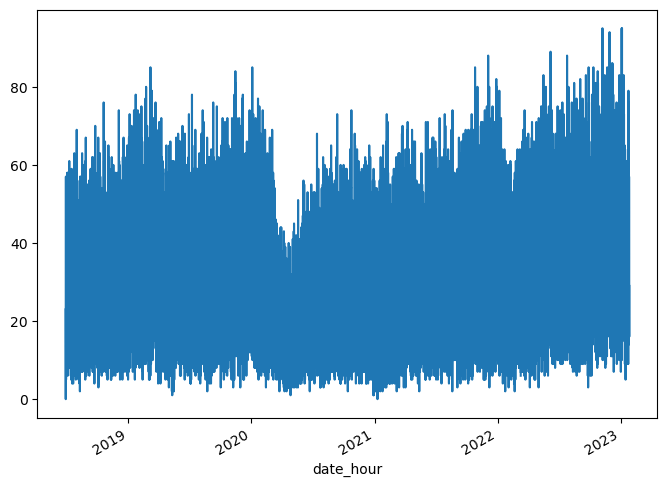

In [15]:
erv_df['ED_Patients'].plot()

In [16]:
import plotly.express as px

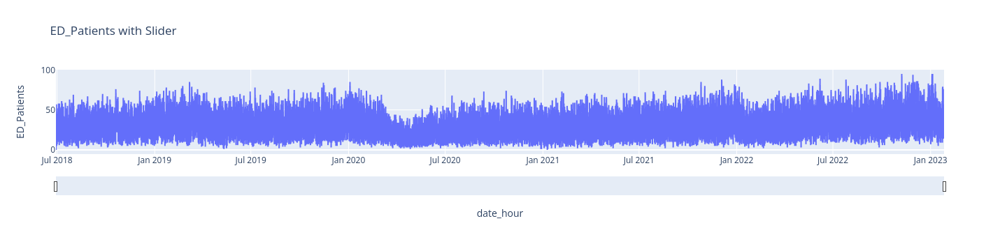

In [17]:
fig = px.line(erv_df_unindexed,
              x='date_hour',
              y='ED_Patients',
              title='ED_Patients with Slider')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

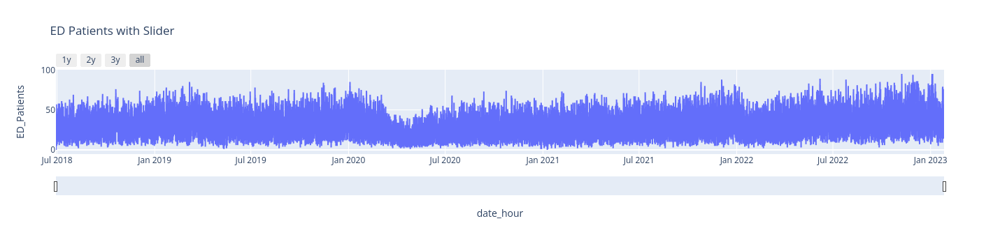

In [18]:
fig = px.line(erv_df_unindexed,
              x='date_hour',
              y='ED_Patients',
              title='ED Patients with Slider')

fig.update_xaxes(
  rangeslider_visible=True,
  rangeselector=dict(
    buttons=list([
      dict(count=1, label="1y", step="year", stepmode="backward"),
      dict(count=2, label="2y", step="year", stepmode="backward"),
      dict(count=3, label="3y", step="year", stepmode="backward"),
      dict(step="all")
    ])
  )
)
fig.show()

In [19]:
df_2021 = erv_df.loc['2021'].reset_index()
df_2022 = erv_df.loc['2022'].reset_index()

Text(0.5, 1.0, 'Patients for 2021 and 2022')

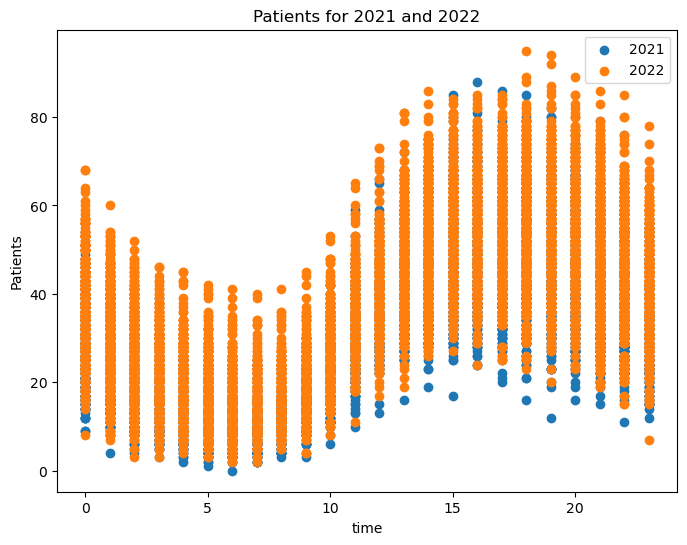

In [20]:
plt.scatter(df_2021['Hour'], df_2021['ED_Patients'])
plt.scatter(df_2022['Hour'], df_2022['ED_Patients'])
plt.legend(['2021', '2022'])
plt.xlabel('time')
plt.ylabel('Patients')
plt.title('Patients for 2021 and 2022')

<AxesSubplot: ylabel='Density'>

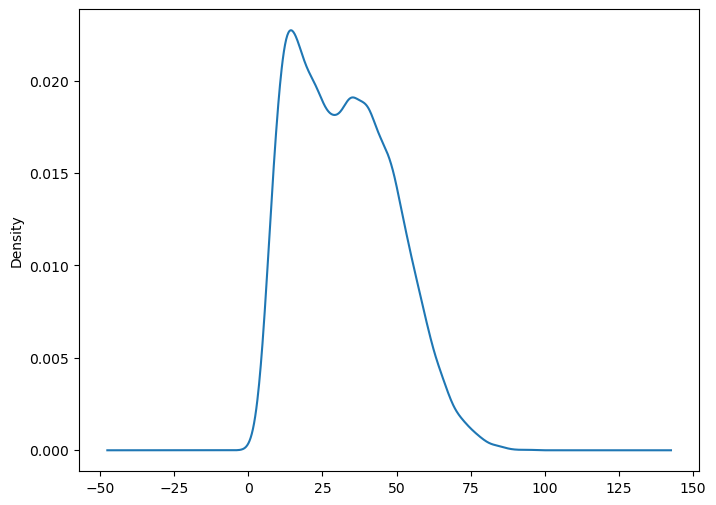

In [21]:
erv_df['ED_Patients'].plot(kind='density')

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 1)'>

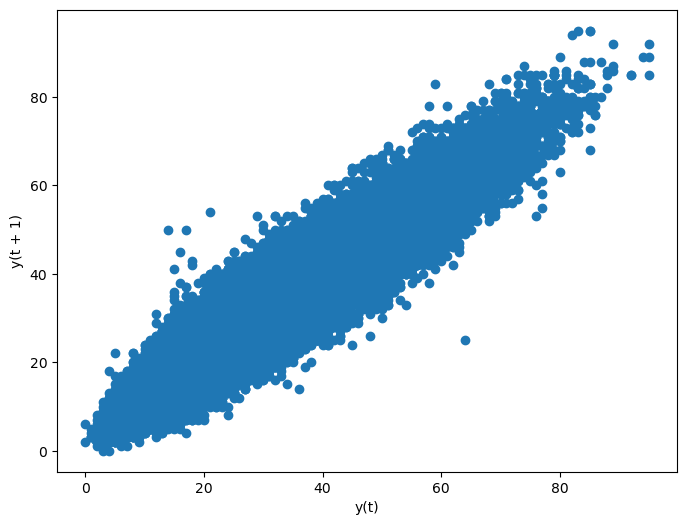

In [22]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=1)

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 12)'>

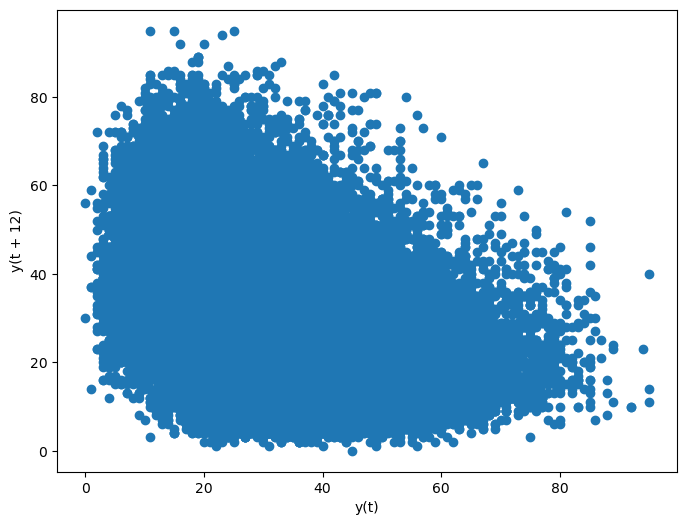

In [23]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=12)

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 24)'>

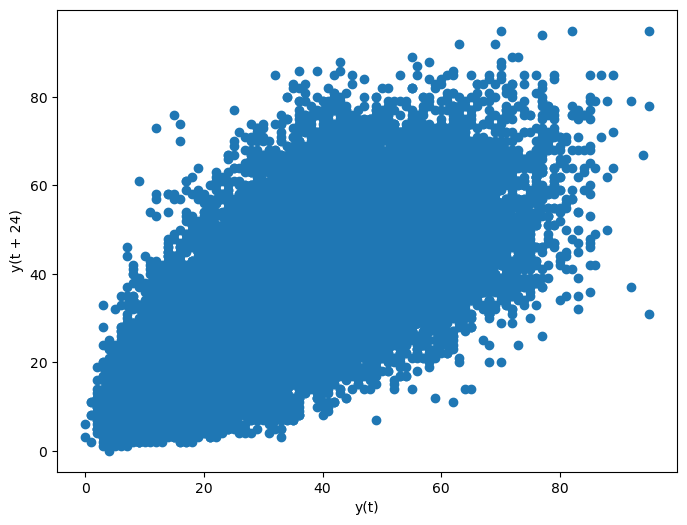

In [24]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=24)

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 8760)'>

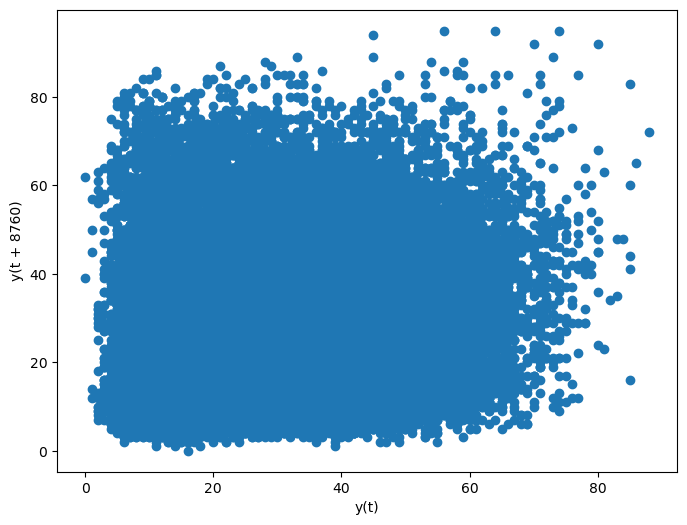

In [25]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=8760)

In [26]:
erv_df.query('ED_Patients != ED_Patients')

,Date,Hour,ED_Patients
date_hour,,,
2021-12-27 11:00:00,2021-12-27,11,NaN
2022-02-04 11:00:00,2022-02-04,11,NaN
2022-02-16 10:00:00,2022-02-16,10,NaN
2022-02-18 08:00:00,2022-02-18,8,NaN
2022-02-22 09:00:00,2022-02-22,9,NaN
2022-02-22 14:00:00,2022-02-22,14,NaN
2022-03-10 05:00:00,2022-03-10,5,NaN


In [27]:
erv_df['ED_Patients']=erv_df['ED_Patients'].fillna(method='ffill')

In [28]:
print("Rows   : ", erv_df.shape[0])
print("Columns: ", erv_df.shape[1])
print("\nFeatures:  \n", erv_df.columns.tolist())
print("\nMissing values:    ", erv_df.isnull().any())
print("\nUnique values:    ", erv_df.nunique())

Rows   :  39838
Columns:  3

Features:  
 ['Date', 'Hour', 'ED_Patients']

Missing values:     Date           False
Hour           False
ED_Patients    False
dtype: bool

Unique values:     Date           1672
Hour             24
ED_Patients      93
dtype: int64


In [29]:
erv_df.describe()

,Hour,ED_Patients
count,39838.000000,39838.000000
mean,11.527085,32.198479
std,6.923401,16.625352
min,0.000000,0.000000
25%,6.000000,18.000000
50%,12.000000,31.000000
75%,18.000000,44.000000
max,23.000000,95.000000


In [30]:
erv_df.index.dtype

dtype('<M8[ns]')

In [31]:
erv_df_unindexed.index.dtype
erv_df.Hour.dtype

dtype('int64')

/tmp/ipykernel_61597/73357762.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



<AxesSubplot: title={'center': 'Vists Per Hour'}, xlabel='Hour'>

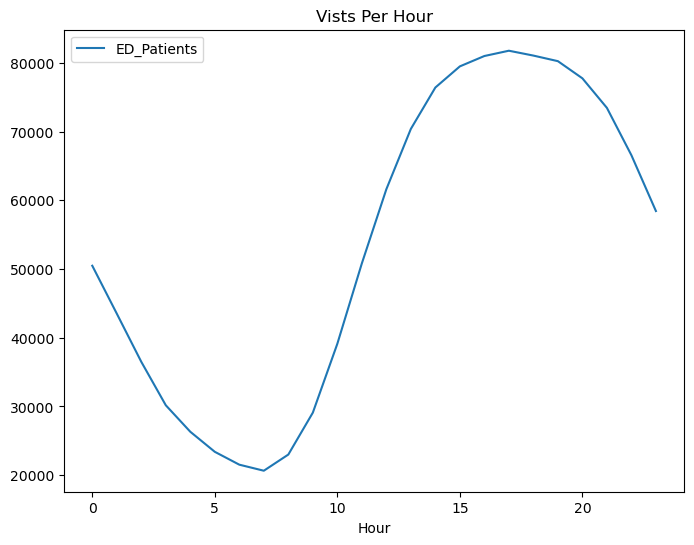

In [32]:
erv_by_day = erv_df.groupby('Hour').sum()
erv_by_day.plot(title='Vists Per Hour')

<AxesSubplot: xlabel='Hour', ylabel='ED_Patients'>

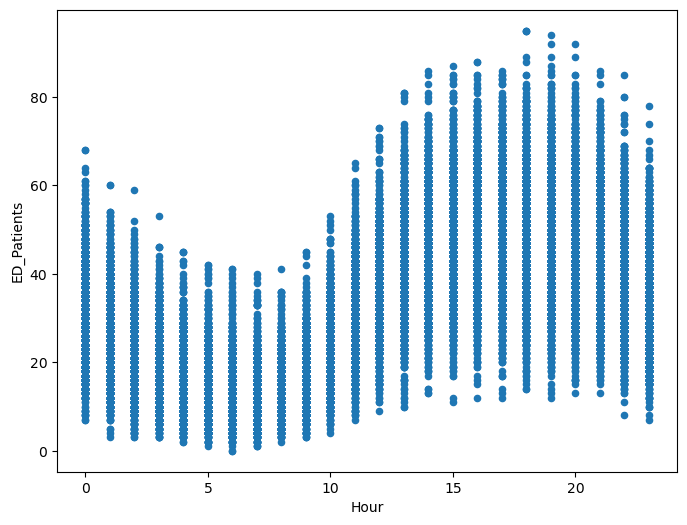

In [33]:
erv_df.plot.scatter(x='Hour',y='ED_Patients')

In [34]:
from statsmodels.tsa.seasonal import seasonal_decompose


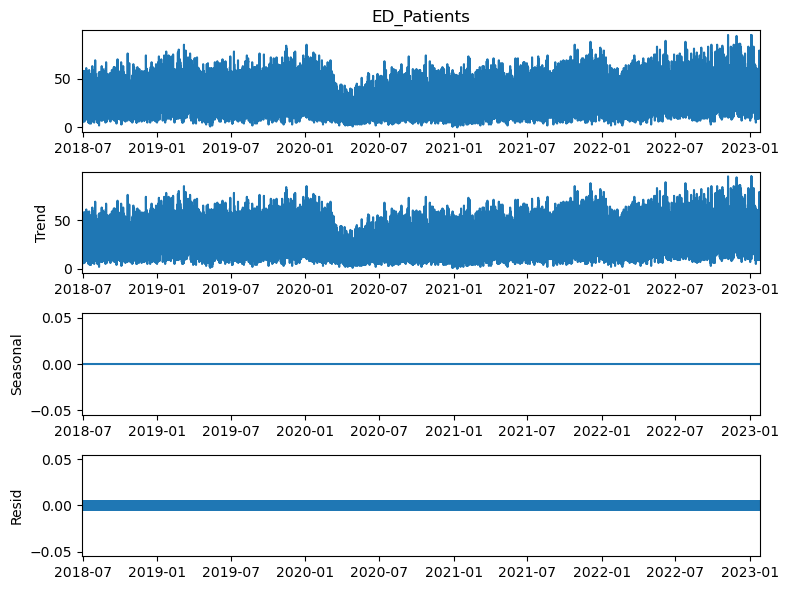

In [35]:
result = seasonal_decompose(erv_df['ED_Patients'],period=1)
fig = result.plot()

In [36]:
erv_df_unindexed

,date_hour,Date,Hour,ED_Patients
0,2018-06-29 00:00:00,2018-06-29,0,23.0
1,2018-06-29 01:00:00,2018-06-29,1,20.0
2,2018-06-29 02:00:00,2018-06-29,2,16.0
3,2018-06-29 03:00:00,2018-06-29,3,6.0
4,2018-06-29 04:00:00,2018-06-29,4,4.0
...,...,...,...,...
39833,2023-01-26 05:00:00,2023-01-26,5,16.0
39834,2023-01-26 06:00:00,2023-01-26,6,19.0
39835,2023-01-26 07:00:00,2023-01-26,7,16.0
39836,2023-01-26 08:00:00,2023-01-26,8,21.0


In [37]:
erv_df.loc['2022-06-01':]

,Date,Hour,ED_Patients
date_hour,,,
2022-06-01 00:00:00,2022-06-01,0,56.0
2022-06-01 01:00:00,2022-06-01,1,50.0
2022-06-01 02:00:00,2022-06-01,2,42.0
2022-06-01 03:00:00,2022-06-01,3,33.0
2022-06-01 04:00:00,2022-06-01,4,30.0
...,...,...,...
2023-01-26 05:00:00,2023-01-26,5,16.0
2023-01-26 06:00:00,2023-01-26,6,19.0
2023-01-26 07:00:00,2023-01-26,7,16.0


In [38]:
from prophet import Prophet
model = Prophet()
erv_df_sliced = erv_df.loc['2022-10-01':]
train_df = erv_df_sliced.rename(columns={"ED_Patients":'y'})
train_df["ds"] = train_df.index
model.fit(train_df)

16:00:04 - cmdstanpy - INFO - Chain [1] start processing
16:00:04 - cmdstanpy - INFO - Chain [1] done processing


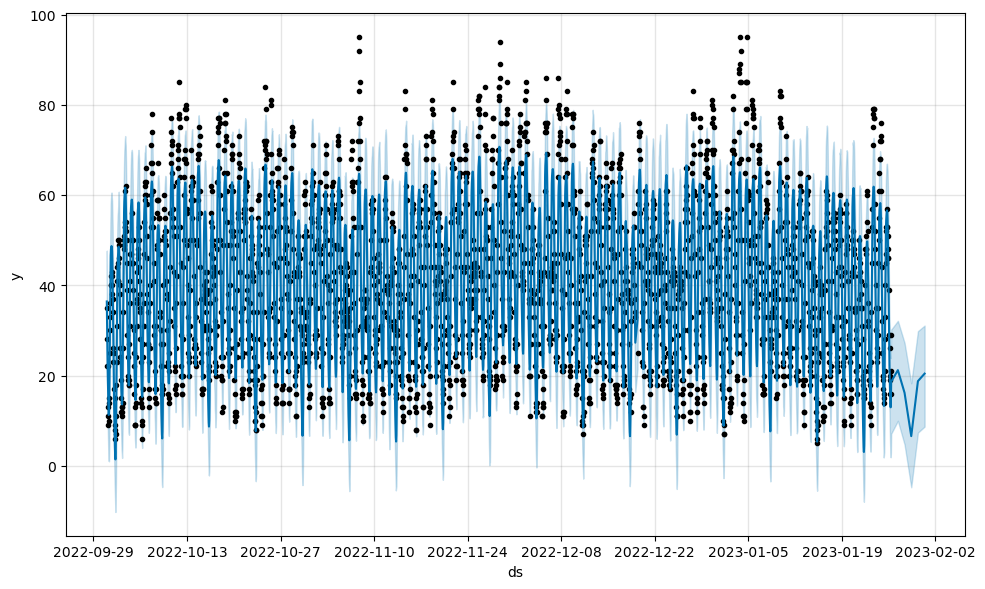

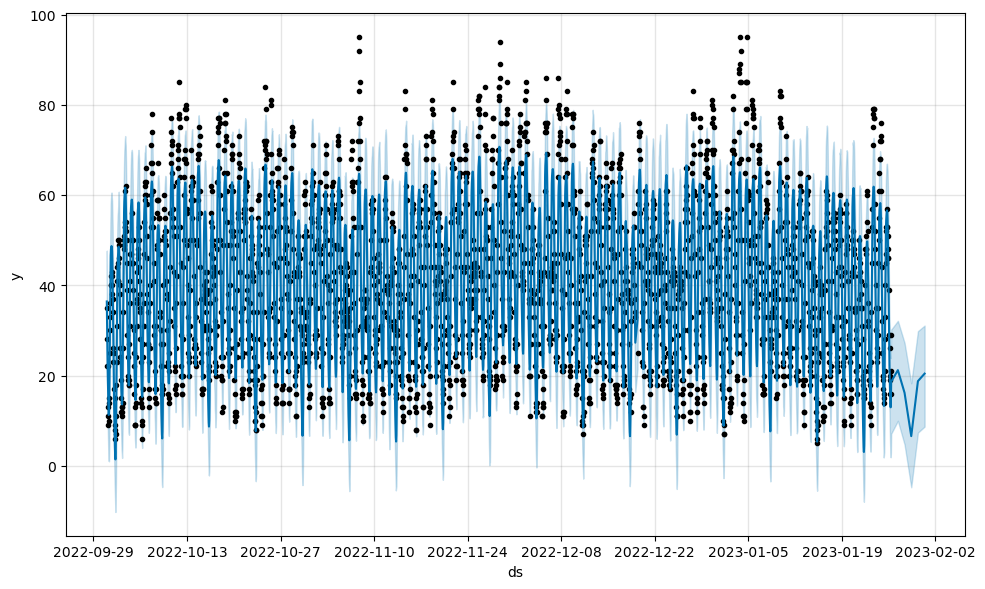

In [39]:
pd.plotting.register_matplotlib_converters()

# We want to forecast over the next 5 months
future = model.make_future_dataframe(5, freq='D', include_history=True)
forecast = model.predict(future)
model.plot(forecast)

In [85]:
split = int(len(erv_df.index) * 0.8)
split

31870

In [87]:
df_train = erv_df[:split]
df_test = erv_df[split:]
print(f"Train length: {len(df_train)}")
print(f"Test length: {len(df_test)}")

Train length: 31870
Test length: 7968


In [92]:
m = Prophet()
erv_df_sliced = erv_df.loc['2022-10-01':]
erv_df_sliced_renamed = erv_df_sliced.rename(columns={"ED_Patients":'y'})
erv_df_sliced_renamed["ds"] = erv_df_sliced_renamed.index
split = int(len(erv_df_sliced_renamed.index) * 0.8)
df_train = erv_df_sliced_renamed[:split]
df_test = erv_df_sliced_renamed[split:]
print(f"Train length: {len(df_train)}")
print(f"Test length: {len(df_test)}")
m.fit(train_df)

09:29:26 - cmdstanpy - INFO - Chain [1] start processing


Train length: 2239
Test length: 560


09:29:26 - cmdstanpy - INFO - Chain [1] done processing


In [93]:
forecast_test = m.predict(df_test)
forecast_train = m.predict(df_train)

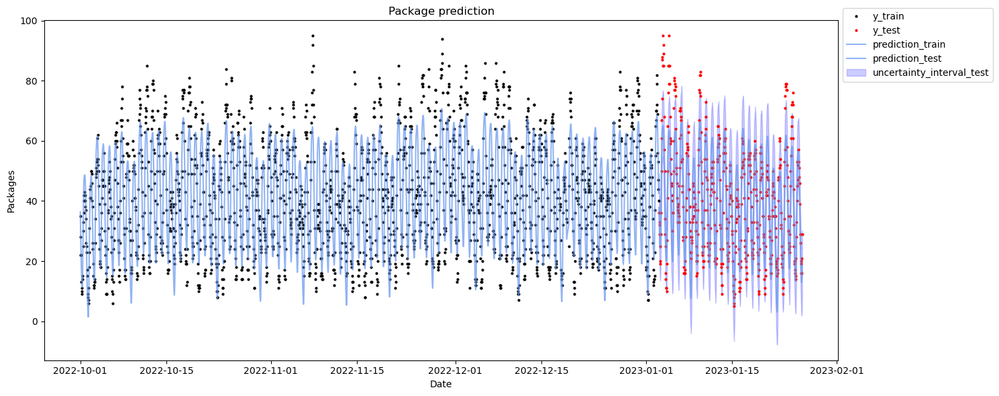

In [94]:
# Prediction Plot
plt.close()
legend = ['y_train', 'y_test', 'prediction_train', 'prediction_test']

fig, ax = plt.subplots(figsize=(15,6))

ax.plot(df_train['ds'], df_train['y'], c='black', marker='o', markersize=2, ls='')
ax.plot(df_test['ds'], df_test['y'], c='r', marker='o', markersize=2, ls='')
ax.plot(forecast_train['ds'], forecast_train['yhat'], ls='-', color='cornflowerblue', alpha=0.7)
ax.plot(forecast_test['ds'], forecast_test['yhat'], ls='-', color='cornflowerblue', alpha=0.7)
ax.fill_between(forecast_test['ds'], forecast_test['yhat_lower'], forecast_test['yhat_upper'], color='b', alpha=0.2)
legend.append('uncertainty_interval_test')
ax.legend(legend, bbox_to_anchor=(1.0, 1.05))
ax.set(title='Package prediction', xlabel='Date', ylabel='Packages')
plt.tight_layout()
plt.show()

In [95]:
from sklearn.metrics import r2_score

def MAPE(actual, forecast):
    actual, forecast = np.array(actual), np.array(forecast)
    return np.mean([100*abs((actual[i]-forecast[i])/actual[i]) for i in range(len(actual))])

def metrics(df_train, forecast_train, df_test, forecast_test):
    MAPE_metric = pd.DataFrame(index=['MAPE'],
                               data={'Train': [MAPE(df_train['y'], forecast_train['yhat'])],
                                    'Test': [MAPE(df_test['y'], forecast_test['yhat'])]})
    r2_metric = pd.DataFrame(index=['R2'],
                             data={'Train': [100*r2_score(y_true=df_train['y'], y_pred=forecast_train['yhat'])],
                                   'Test': [100*r2_score(y_true=df_test['y'], y_pred=forecast_test['yhat'])]})

    return pd.concat([MAPE_metric, r2_metric])

In [96]:
metrics(df_train, forecast_train, df_test, forecast_test)

,Train,Test
MAPE,20.382925,20.496768
R2,79.242129,76.431464


In [97]:
model = Prophet(weekly_seasonality=False)
model.add_seasonality(name="hourly", period=24, fourier_order=5)
erv_df_sliced = erv_df.loc['2022-10-01':]
train_df = erv_df_sliced.rename(columns={"ED_Patients":'y'})
train_df["ds"] = train_df.index
model.fit(train_df)

09:33:52 - cmdstanpy - INFO - Chain [1] start processing
09:33:52 - cmdstanpy - INFO - Chain [1] done processing


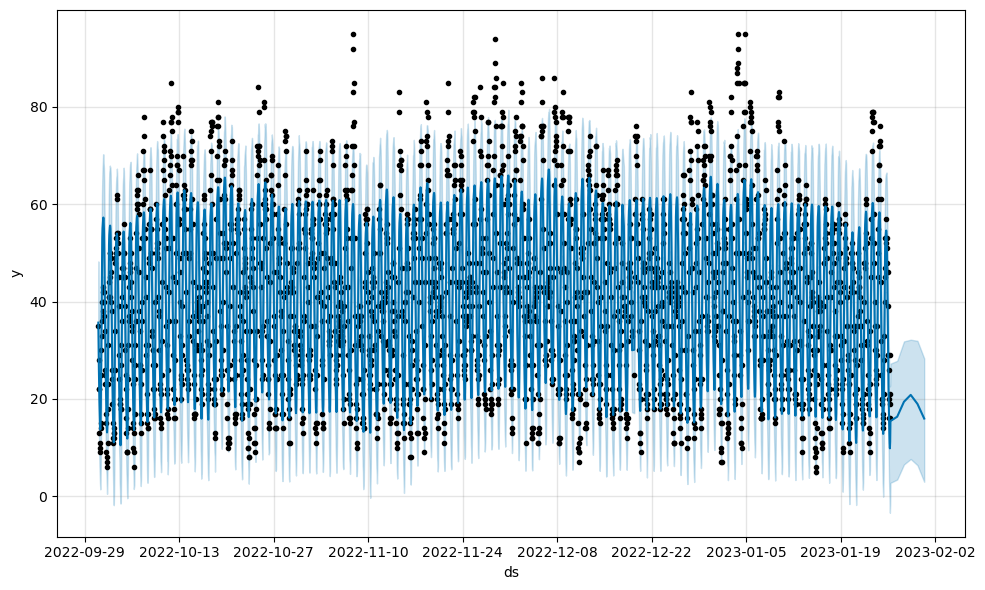

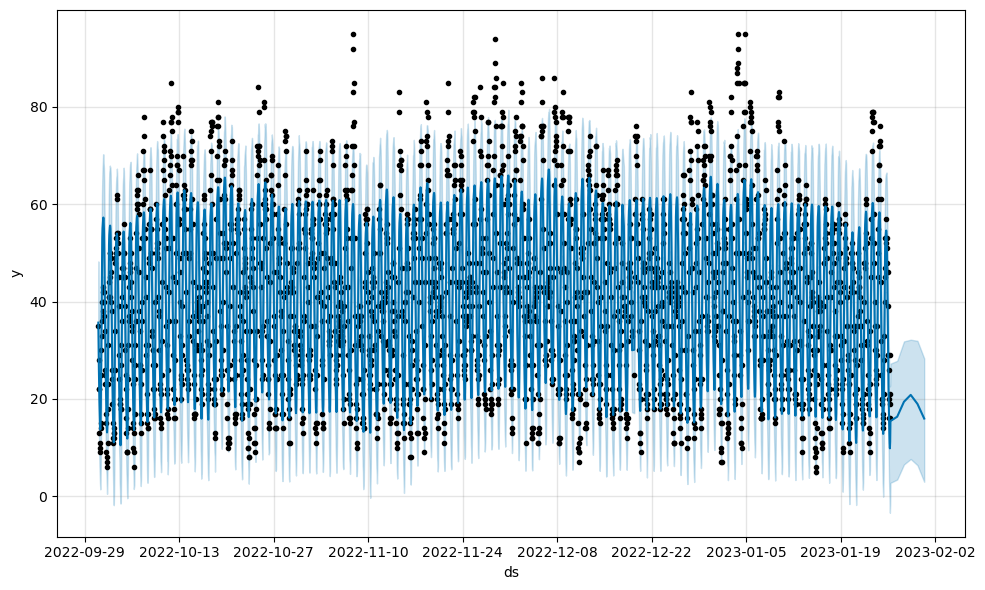

In [98]:
pd.plotting.register_matplotlib_converters()

# We want to forecast over the next 5 months
future = model.make_future_dataframe(5, freq='D', include_history=True)
forecast = model.predict(future)
model.plot(forecast)

In [99]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name="hourly", period=24, fourier_order=5)
erv_df_sliced = erv_df.loc['2022-10-01':]
erv_df_sliced_renamed = erv_df_sliced.rename(columns={"ED_Patients":'y'})
erv_df_sliced_renamed["ds"] = erv_df_sliced_renamed.index
split = int(len(erv_df_sliced_renamed.index) * 0.8)
df_train = erv_df_sliced_renamed[:split]
df_test = erv_df_sliced_renamed[split:]
print(f"Train length: {len(df_train)}")
print(f"Test length: {len(df_test)}")
m.fit(train_df)

09:36:34 - cmdstanpy - INFO - Chain [1] start processing


Train length: 2239
Test length: 560


09:36:34 - cmdstanpy - INFO - Chain [1] done processing


In [101]:
forecast_test = m.predict(df_test)
forecast_train = m.predict(df_train)
metrics(df_train, forecast_train, df_test, forecast_test)

,Train,Test
MAPE,22.073628,21.598675
R2,73.414010,74.140939
